In [1]:
# (_.~" IMPORTS "~._) 

# Import des librairies
import numpy as np
import pandas as pd
import datetime
import matplotlib.dates as mdates

from PIL import Image

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly import tools

%matplotlib inline

# Suppression des warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

# Import des fichiers
df = pd.read_csv("FinalDataset.csv")

# (_.~" FORMATAGE "~._) 

# Création de la colonne Date
df["Date"] = pd.to_datetime(df['Year'].astype("str")+" "+df['Month'].astype("str"),format="%Y %m")

# Réparation coquilles
df = df.replace("SSMU", "SSBU")
df = df[df["Date"]<='2023-01-01']

display(df.head(5))
#print(df.columns)

,Game,Year,Month,Sales,Diff,Reply_SUM,Reply_MEAN,Reply_MAX,Reply_MIN,Like_SUM,...,User Following count_MIN,User Following count_SUM,Sentiment_TEXTBLOB_MEAN,Sentiment_VADER_MEAN,Sentiment_NLTK_MEAN,meanAMZ,countAMZ,meanMTC,countMTC,Date
0,ACNH,2019,6,NaN,NaN,3134.0,19.710692,222.0,0.0,193304.0,...,0.0,213996.0,0.786164,0.139094,0.137810,NaN,NaN,NaN,NaN,2019-06-01
1,ACNH,2019,7,NaN,NaN,118.0,13.111111,29.0,4.0,2586.0,...,55.0,23126.0,0.777778,0.416189,0.367333,NaN,NaN,NaN,NaN,2019-07-01
2,ACNH,2019,8,NaN,NaN,73.0,8.111111,29.0,2.0,2652.0,...,5.0,12607.0,0.111111,0.212211,0.212211,NaN,NaN,NaN,NaN,2019-08-01
3,ACNH,2019,9,NaN,NaN,571.0,10.773585,115.0,0.0,46792.0,...,0.0,24873.0,0.849057,0.211902,0.211902,NaN,NaN,NaN,NaN,2019-09-01
4,ACNH,2019,10,NaN,NaN,281.0,8.028571,30.0,0.0,7893.0,...,0.0,24070.0,0.828571,0.209926,0.209926,NaN,NaN,NaN,NaN,2019-10-01


In [2]:
CountList = ['countMTC','countAMZ']
MeanList = ['meanMTC','meanAMZ']

dfNoNan = df

dfmean = pd.DataFrame()
dfcount = pd.DataFrame()

# Methodes
def weighted_average(group):
        weights_sum = np.sum(group[qty])
        if weights_sum > 0:
            return np.average(group[qly], weights=group[qty])
        else:
            return np.nan

# Calcul de la moyenne pondérée pour chaque groupe
for qty, qly in zip(CountList,MeanList):
    dfNoNan[qty] = dfNoNan[qty].fillna(0)
    dfNoNan[qly] = dfNoNan[qly].fillna(0)
    dfmean = dfmean.append(dfNoNan.groupby("Game").apply(weighted_average),ignore_index=True)

# Mise en forme du dataframe
dfmean = dfmean.rename(index=dict(zip(dfmean.index, MeanList)))
dfmean = dfmean.T.reset_index()
dfmean = pd.concat([dfmean,
                    dfNoNan.groupby("Game").agg({'countAMZ':"sum"}).reset_index(drop=True),
                    dfNoNan.groupby("Game").agg({"countMTC":"sum"}).reset_index(drop=True)], 
                    axis=1)
dfmean = dfmean.drop([5,6])

dfmean

,Game,meanMTC,meanAMZ,countAMZ,countMTC
0,ACNH,4.114031,9.098775,2531.0,3920.0
1,BOTW,9.020622,9.752435,7699.0,5334.0
2,MKD8,8.287819,8.903261,1840.0,1018.0
3,POKE,6.380933,8.791736,1210.0,2402.0
4,SSBU,8.315330,8.999050,1053.0,1259.0


In [3]:
# (_.~" METHODE "~._) 

print("rapidGame()")

"""def rapidGame(Game,Col1,Col2):
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.add_trace(go.Scatter(x=df["Date"][df["Game"]==Game],
                             y=df[Col1][df["Game"]==Game],
                             name = Col1,
                             connectgaps=True),
                             secondary_y=False)
    fig.add_trace(go.Scatter(x=df["Date"][df["Game"]==Game],
                             y=df[Col2][df["Game"]==Game],
                             name = Col2,
                             connectgaps=True),
                             secondary_y=True)
    fig.update_xaxes(title_text=Game+" "+Col1+"/"+Col2)
    fig.update_yaxes(title_text=Col1, secondary_y=False)
    fig.update_yaxes(title_text=Col2, secondary_y=True)
    fig.show()"""

# Test
# rapidGame("ACNH","Diff","Reply_SUM")

rapidGame()


'def rapidGame(Game,Col1,Col2):\n    fig = make_subplots(specs=[[{"secondary_y": True}]])\n    fig.add_trace(go.Scatter(x=df["Date"][df["Game"]==Game],\n                             y=df[Col1][df["Game"]==Game],\n                             name = Col1,\n                             connectgaps=True),\n                             secondary_y=False)\n    fig.add_trace(go.Scatter(x=df["Date"][df["Game"]==Game],\n                             y=df[Col2][df["Game"]==Game],\n                             name = Col2,\n                             connectgaps=True),\n                             secondary_y=True)\n    fig.update_xaxes(title_text=Game+" "+Col1+"/"+Col2)\n    fig.update_yaxes(title_text=Col1, secondary_y=False)\n    fig.update_yaxes(title_text=Col2, secondary_y=True)\n    fig.show()'

In [4]:
# (_.~" CORELATION "~._) 

print("HEATMAPS")

#method = ['pearson','kendall','spearman']

#for met in method:
#    df_heatmap = df.corr(method=met)
#    print("With ",met," :")
#    fig = px.imshow(df_heatmap)
#    fig.show()

HEATMAPS


In [5]:
# (_.~" EXPLORATION "~._) 

print("EXPLORATION")

#gameList = ['ACNH','BOTW','SSBU','MKD8','POKE']
#
#colList = ['Reply_SUM', 'Like_SUM', 'Retweet_SUM','Retweet_MEAN', 'User Followers count_SUM','User Followers count_MEAN',
#           'Sentiment_TEXTBLOB_MEAN', 'Sentiment_VADER_MEAN','Sentiment_NLTK_MEAN', 
#           'meanAMZ', 'countAMZ', 'meanMTC', 'countMTC']

#for game in gameList:
#    print("\n",game,"\n")
#    for col in colList:
#        rapidGame(game,"Diff",col)

EXPLORATION


In [6]:
#           (_.~" ACNH "~._) 

# ----

# Like_SUM et Diff
acnhLike = make_subplots(specs=[[{"secondary_y": True}]])

# Like_SUM
acnhLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="ACNH"], 
                              y = df['Like_SUM'][df["Game"]=="ACNH"],
                              name = "Likes",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.2s}</b> Likes</br>'),
                             secondary_y=False)

acnhLike.add_annotation(x=datetime.date(2019,6,1), 
                        y=190000,
                        text="Nintendo Direct<br>Annonce sortie",
                        showarrow=True,
                        arrowhead=1,
                        ax=20,
                        ay=-80,
                        xanchor="left")

acnhLike.add_annotation(x=datetime.date(2020,3,1), 
                        y=1500000,
                        text="Sortie du jeu",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=10,
                        xanchor="left")

acnhLike.add_annotation(x=datetime.date(2021,3,1), 
                        y=383500,
                        text="Update 1.8<br>'Super Mario 35 ans'",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=-100,)

acnhLike.add_annotation(x=datetime.date(2021,10,1), 
                        y=287100,
                        text="Annonce du DLC<br>'Happy Home Paradise'",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=-60,)

# Diff
acnhLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="ACNH"], 
                              y = df['Diff'][df["Game"]=="ACNH"],
                              hovertemplate = '%{x|%Y %b}'+
                                              '<br><b>%{y}M</b> Units</br>',
                              name = "Ventes",
                              line_shape='vh',
                              connectgaps=True),
                             secondary_y=True)

# Titre et yRange
acnhLike.update_layout(legend=dict(orientation="h"),
                       title_text="Animal Crossing: New Horizons - Likes et ventes du jeux",
                       yaxis=dict(range=[0, 1600000]),
                       yaxis2=dict(tickmode='auto',
                                   range=[0, 16]))

# X-axis Titre
acnhLike.update_xaxes(title_text="Date")

# Y-axes Titre
acnhLike.update_yaxes(title_text="Likes par mois", secondary_y=False)
acnhLike.update_yaxes(title_text="Ventes par trimestres (en M)", secondary_y=True)

#Affichage
acnhLike.show();

# ----

# Metacritic Count and Mean
acnhMtc = make_subplots(specs=[[{"secondary_y": True}]])

# Mean
acnhMtc.add_trace(go.Scatter(x = df['Date'][df["Game"]=="ACNH"], 
                              y = df['meanMTC'][df["Game"]=="ACNH"],
                              name = "Moyenne",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y}</b> /10</br>'),
                             secondary_y=True)

# Count
acnhMtc.add_trace(go.Bar(x = df['Date'][df["Game"]=="ACNH"], 
                              y = df['countMTC'][df["Game"]=="ACNH"],
                              hovertemplate = '%{x|%Y %b}'+
                                              '<br><b>%{y}</b> comments</br>',
                              name = "Quantité",
                              yaxis='y2'),
                             secondary_y=False)



# Annotation

acnhMtc.add_annotation(x=datetime.date(2020,5,1), 
                        y=500,
                        text="<b>2026</b> : 2020 Mars <br><b>552</b> : 2020 Avril</br>",
                        showarrow=True,
                        arrowhead=1,
                        ax=20,
                        ay=50,
                        xanchor="left")

# Titre et yRange
acnhMtc.update_layout(legend=dict(orientation="h"),
                      title_text="Animal Crossing: New Horizons - Evolution des commentaires Metacritic",
                      hovermode="x unified",
                      yaxis=dict(range=[0, 500]),
                      yaxis2=dict(tickmode='auto',
                                   range=[0, 10],
                                  overlaying='y'))
# Affichage
acnhMtc.show();

# ----


In [7]:
#           (_.~" BOTW "~._) 

# ----

# Like_SUM et Diff
botwLike = make_subplots(specs=[[{"secondary_y": True}]])

# Like_SUM
botwLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="BOTW"], 
                              y = df['Like_SUM'][df["Game"]=="BOTW"],
                              name = "Likes",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.2s}</b> Likes</br>'),
                             secondary_y=False)

# Regression Polynomiale
x = mdates.date2num(df['Date'][df["Game"]=="BOTW"])
y = df['Like_SUM'][df["Game"]=="BOTW"]
# Polynomiale de degré 3
coeffs = np.polyfit(x, y, 3)
trendline = coeffs[0] * x**3 + coeffs[1] * x**2 + coeffs[2] * x + coeffs[3]

botwLike.add_trace(go.Scatter(x=df['Date'][df["Game"]=="BOTW"], 
                              y=trendline,
                              name="Tendance des likes",
                              hoverinfo='skip'))


# Diff
botwLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="BOTW"], 
                              y = df['Diff'][df["Game"]=="BOTW"],
                              hovertemplate = '%{x|%Y %b}'+
                                              '<br><b>%{y}M</b> Units</br>',
                              name = "Ventes",
                              line_shape='vh',
                              connectgaps=True),
                             secondary_y=True)

# Annotation
botwLike.add_annotation(x=datetime.date(2019,6,1), 
                        y=490000,
                        text="Annonce de <br>'Tears Of The Kingdom'",
                        showarrow=True,
                        arrowhead=1,
                        ax=-30,
                        ay=10,
                        xanchor="right")

botwLike.add_annotation(x=datetime.date(2016,6,1), 
                        y=62000,
                        text="Annonce<br>lors de l'E3",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=-90,
                        xanchor="center")

botwLike.add_annotation(x=datetime.date(2017,3,1), 
                        y=310000,
                        text="Sortie du jeu",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=-10,
                        xanchor="left")

botwLike.add_annotation(x=datetime.date(2021,3,1), 
                        y=470000,
                        text="Annonce de <br>'Skyward Sword HD'",
                        showarrow=True,
                        arrowhead=1,
                        ax=-20,
                        ay=30,
                        xanchor="right")

botwLike.add_annotation(x=datetime.date(2021,6,1), 
                        y=370000,
                        text="Informations sur<br>'Tears Of The Kingdom'",
                        showarrow=True,
                        arrowhead=1,
                        ax=40,
                        ay=-30,
                        xanchor="left")

botwLike.add_annotation(x=datetime.date(2022,1,1), 
                        y=340000,
                        text=" ",
                        showarrow=True,
                        arrowhead=1,
                        ax=20,
                        ay=-30,
                        xanchor="left")


# Titre et yRange
botwLike.update_layout(legend=dict(orientation="h"),
                       title_text="The Legend of Zelda: Breath of the Wild - Likes et ventes du jeux",
                       yaxis=dict(range=[0, 500000]),
                       yaxis2=dict(tickmode='auto',
                                   range=[0, 5]))

# X-axis Titre
botwLike.update_xaxes(title_text="Date")

# Y-axes Titre
botwLike.update_yaxes(title_text="Likes par mois", secondary_y=False)
botwLike.update_yaxes(title_text="Ventes par trimestres (en M)", secondary_y=True)

#Affichage
botwLike.show();

# ----

# Like_SUM et Diff
botwNote = make_subplots(rows=1, cols=2,
                         subplot_titles=("Metacritic", "Amazon"))

botwNote.add_trace(go.Bar(x=dfmean["Game"], y=dfmean["countMTC"],
                          marker=dict(color=dfmean["meanMTC"], 
                                      coloraxis="coloraxis"),
                          name="Metacritic",
                          hovertemplate = '%{x}'+
                                          '<br>%{text:.1f}/10</br>'+
                                          "%{y:.2s} comments",
                          text=dfmean["meanMTC"],
                          texttemplate = "%{text:.2f}"),
                   row=1, col=1)

botwNote.add_trace(go.Bar(x=dfmean["Game"], y=dfmean["countAMZ"],
                          marker=dict(color=dfmean["meanAMZ"], 
                                      coloraxis="coloraxis"),
                          name="Amazon",
                          hovertemplate = '%{x}'+
                                          '<br>%{text:.1f}/10</br>'+
                                          "%{y:.2s} comments",
                          text=dfmean["meanAMZ"],
                          texttemplate = "%{text:.2f}"),
                   row=1, col=2)

# Y-axes
botwNote.update_yaxes(title_text="Quantité",range=[0, 6000], row=1, col=1)
botwNote.update_yaxes(title_text="Quantité",range=[0, 9000], row=1, col=2)

# Legend
botwNote.update_layout(legend=dict(orientation="h",
                                   yanchor="bottom",
                                   y=1.1,
                                   xanchor="right",
                                   x=1))
botwNote.update_traces(textfont_size=12,
                       textangle=0, 
                       textposition="outside", 
                       cliponaxis=False,
                       showlegend=False)

# Titre
botwNote.update_layout(legend=dict(orientation="h"),
                       title_text="The Legend of Zelda: Breath of the Wild - Notes émises par le publique (/10)",
                       coloraxis=dict(colorscale='Rdylgn'))

botwNote.show();

# ----

# Sortie du jeu attendu 
labels = ['Nintendo Switch','Others Software','Breath Of The Wild']
values = [2.74,2.7,2.76]

# Camembert
botwPreS = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0, 0.2])])

# Personnalisation
botwPreS.update_traces(hoverinfo='label+percent', textinfo='label+value', textfont_size=16,
                       showlegend=False)

# Titre
botwPreS.update_layout(title_text="The Legend of Zelda: Breath of the Wild - Ventes selon Nintendo au 30 Mars 2017")

#Affichage
botwPreS.show();

# ---

In [8]:
#           (_.~" SSBU "~._) 

# ----

# Like_SUM et Diff
ssbuLike = make_subplots(specs=[[{"secondary_y": True}]])

# Like_SUM
ssbuLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="SSBU"], 
                              y = df['Like_SUM'][df["Game"]=="SSBU"],
                              name = "Likes",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.2s}</b> Likes</br>'),
                             secondary_y=False)


# Diff
ssbuLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="SSBU"], 
                              y = df['Diff'][df["Game"]=="SSBU"],
                              hovertemplate = '%{x|%Y %b}'+
                                              '<br><b>%{y}M</b> Units</br>',
                              name = "Ventes",
                              line_shape='vh',
                              connectgaps=True),
                             secondary_y=True)

# Annotation

ssbuLike.add_annotation(x=datetime.date(2018,3,1), 
                        y=100000,
                        text="Annonce de la sortie<br>Nintendo Direct",
                        showarrow=True,
                        arrowhead=1,
                        ax=-30,
                        ay=-10,
                        xanchor="right")

ssbuLike.add_annotation(x=datetime.date(2018,12,1), 
                        y=480000,
                        text="Sortie du jeu",
                        showarrow=True,
                        arrowhead=1,
                        ax=-30,
                        ay=-10,
                        xanchor="right")

ssbuLike.add_annotation(x=datetime.date(2020,1,1), 
                        y=440000,
                        text="DLC Fire Emblem",
                        showarrow=True,
                        arrowhead=1,
                        ax=-30,
                        ay=-30,
                        xanchor="center")

ssbuLike.add_annotation(x=datetime.date(2020,10,1), 
                        y=430000,
                        text="DLC Minecraft",
                        showarrow=True,
                        arrowhead=1,
                        ax=-20,
                        ay=-60,
                        xanchor="center")

ssbuLike.add_annotation(x=datetime.date(2021,10,1), 
                        y=460000,
                        text="DLC Kingdom Hearts",
                        showarrow=True,
                        arrowhead=1,
                        ax=-10,
                        ay=-70,
                        xanchor="center")

# Titre et yRange
ssbuLike.update_layout(legend=dict(orientation="h"),
                       title_text="Super Smash Bros. Ultimate - Likes et ventes du jeux",
                       yaxis=dict(range=[0, 650000]),
                       yaxis2=dict(tickmode='auto',
                                   range=[0, 13]))

# X-axis Titre
ssbuLike.update_xaxes(title_text="Date")


# Y-axes Titre
ssbuLike.update_yaxes(title_text="Likes par mois", secondary_y=False)
ssbuLike.update_yaxes(title_text="Ventes par trimestres (en M)", secondary_y=True)

#Affichage
ssbuLike.show();

# ---

# Sentiment_TEXTBLOB_MEAN
ssbuBlob = make_subplots(specs=[[{"secondary_y": True}]])

# Like_SUM
ssbuBlob.add_trace(go.Scatter(x = df['Date'][df["Game"]=="SSBU"], 
                              y = df['Sentiment_TEXTBLOB_MEAN'][df["Game"]=="SSBU"],
                              name = "TextBlob",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y}</b></br>'),
                             secondary_y=False)

# Tendance
ssbuBlob.add_trace(go.Scatter(x = [datetime.date(2017,1,1),datetime.date(2018,12,1),datetime.date(2021,8,1),datetime.date(2023,1,1)], 
                              y = [0.9,0.9,0.6,1],
                              name = "Tendance",
                              hoverinfo='skip'),
                             secondary_y=False)

# Annotations
ssbuBlob.add_annotation(x=datetime.date(2018,12,1), 
                        y=0.9,
                        text="Sortie du jeu",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=-10,
                        xanchor="left")

ssbuBlob.add_annotation(x=datetime.date(2021,8,1), 
                        y=0.6,
                        text="Reprise du<br><b>Smash World Tour</b><br><i>Compétition Esport</i>",
                        showarrow=True,
                        arrowhead=1,
                        ax=30,
                        ay=10,
                        xanchor="left")

# Titre 
ssbuBlob.update_layout(legend=dict(orientation="h"),
                       title_text="Super Smash Bros. Ultimate - Sentiment Analysis par TextBlob")

# X-axis Titre
ssbuBlob.update_xaxes(title_text="Date")

# Y-axis Titre
ssbuBlob.update_yaxes(title_text="Sentiment", secondary_y=False)

ssbuBlob.show();

In [9]:
#           (_.~" MKD8 "~._) 

# ----

# Like_SUM et Diff
mkd8Like = make_subplots(specs=[[{"secondary_y": True}]])

# Like_SUM
mkd8Like.add_trace(go.Scatter(x = df['Date'][df["Game"]=="MKD8"], 
                              y = df['Like_SUM'][df["Game"]=="MKD8"],
                              name = "Likes",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.2s}</b> Likes</br>'),
                             secondary_y=False)

# Annotations
mkd8Like.add_annotation(x=datetime.date(2017,4,1), 
                        y=33000,
                        text="Sortie du jeu",
                        showarrow=True,
                        arrowhead=1,
                        ax=40,
                        ay=-90,
                        xanchor="left")

mkd8Like.add_annotation(x=datetime.date(2022,3,1), 
                        y=165000,
                        text="V2.0<br><i>Mise à jour</i>",
                        showarrow=True,
                        arrowhead=1,
                        ax=-30,
                        ay=10,
                        xanchor="right")

# Highlight augmentation likes 
mkd8Like.add_vrect(x0=datetime.date(2021,4,1), x1=datetime.date(2022,12,1), 
                   annotation_text="Augmentation de l'activité Twitter", 
                   annotation_position="top right",  
                   annotation_font_size=11,
                   annotation_font_color="Black",
                   fillcolor="green", opacity=0.1, line_width=0)


# Diff
mkd8Like.add_trace(go.Scatter(x = df['Date'][df["Game"]=="MKD8"], 
                              y = df['Diff'][df["Game"]=="MKD8"],
                              hovertemplate = '%{x|%Y %b}'+
                                              '<br><b>%{y}M</b> Units</br>',
                              name = "Ventes",
                              line_shape='vh',
                              connectgaps=True),
                             secondary_y=True)

# Titre et yRange
mkd8Like.update_layout(legend=dict(orientation="h"),
                       title_text="Mario Kart 8 Deluxe - Likes et ventes du jeux",
                       yaxis=dict(range=[0, 180000]),
                       yaxis2=dict(tickmode='auto',
                                   range=[0,9]))

# X-axis Titre
mkd8Like.update_xaxes(title_text="Date")


# Y-axes Titre
mkd8Like.update_yaxes(title_text="Likes par mois", secondary_y=False)
mkd8Like.update_yaxes(title_text="Ventes par trimestres (en M)", secondary_y=True)

#Affichage
mkd8Like.show();

# ---

# La force tranquille

# Création de dfcomp
dfcomp = df.groupby("Game").agg({"Like_SUM":"sum","Sales":"max","Diff":"mean",'Sentiment_TEXTBLOB_MEAN':"mean"}).sort_values(by="Sales",ascending=False).drop(['SWCH','TOTL']).reset_index()
dfcomp = dfcomp.rename(columns={"Sentiment_TEXTBLOB_MEAN": "TextBlob Note"})

# Marker avec couleur selon la note
mkd8Sent = px.scatter(dfcomp, x="Like_SUM", y="Sales", hover_name="Game",
                      log_x=True,
                      color="TextBlob Note",
                      color_continuous_scale="Rdylgn",
                      hover_data={'Game':False,
                                  'TextBlob Note':':.3',
                                  'Like_SUM':':.2s',
                                  'Sales':':.2f'})

mkd8Sent.update_traces(marker=dict(size=16, symbol="diamond"),
                       selector=dict(mode="markers"))

# Text au niveau des markers
mkd8Sent.add_trace(go.Scatter(x=dfcomp["Like_SUM"],
                              y=dfcomp["Sales"],
                              text=dfcomp["Game"],
                              mode="text",
                              name="Lines and Text",
                              texttemplate="<br><b>%{text}</b><br>%{y:.2s}M units<br>%{x:.2s} Likes<br>",
                              textposition=["bottom right",
                                            "top right",
                                            "top left",
                                            "bottom right",
                                            "top left"]))

# Titre et yRange
mkd8Sent.update_layout(legend=dict(orientation="h"),
                       title_text="Mario Kart 8 Deluxe - La force tranquille")

# X-axis Titre
mkd8Sent.update_xaxes(title_text="Likes sur toute la période")

# Y-axes Titre
mkd8Sent.update_yaxes(title_text="Vente totale (en M)")

# Masquage de la légende
mkd8Sent.update_traces(showlegend=False)

# Affichage
mkd8Sent.show();

# ---

In [10]:
#           (_.~" POKE "~._) 

# ----

# Like_SUM / Diff / User Mean
pokeLike = make_subplots(specs=[[{"secondary_y": True}]])

# Like_SUM
pokeLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="POKE"], 
                              y = df['Like_SUM'][df["Game"]=="POKE"],
                              name = "Likes",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.2s}</b> Likes</br>'),
                             secondary_y=True)


# User Followers count_MEAN
pokeLike.add_trace(go.Scatter(x = df['Date'][df["Game"]=="POKE"], 
                              y = df['User Followers count_MEAN'][df["Game"]=="POKE"],
                              name = "Moyenne des followers",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.2s}</b> Follows</br>'),
                             secondary_y=True)

# Diff
pokeLike.add_trace(go.Bar(x = df['Date'][df["Game"]=="POKE"], 
                          y = df['Diff'][df["Game"]=="POKE"],
                          hovertemplate = '%{x|%Y %b}'+
                                          '<br><b>%{y}M</b> Units</br>',
                          name = "Ventes"),
                         secondary_y=False)


# Annotations
pokeLike.add_annotation(x=datetime.date(2018,11,1), 
                        y=3.6,
                        text="Let's Go, Pikachu / Évoli",
                        showarrow=True,
                        arrowhead=1,
                        ax=-30,
                        ay=-90,
                        xanchor="right")

pokeLike.add_annotation(x=datetime.date(2019,6,1), 
                        y=10,
                        text="Pokémon Direct et E3",
                        showarrow=True,
                        arrowhead=1,
                        ax=-40,
                        ay=-50,
                        xanchor="right")

pokeLike.add_annotation(x=datetime.date(2019,11,1), 
                        y=12.5,
                        text="Épée / Bouclier",
                        showarrow=True,
                        arrowhead=1,
                        ax=-40,
                        ay=-50,
                        xanchor="right")

pokeLike.add_annotation(x=datetime.date(2021,2,1), 
                        y=8.1,
                        text="Annonce de<br>'Legends : Arceus'",
                        showarrow=True,
                        arrowhead=1,
                        ax=-10,
                        ay=-50,
                        xanchor="center")

pokeLike.add_annotation(x=datetime.date(2021,11,1), 
                        y=8,
                        text="Diamant Étincelant / Perle Scintillante<br><i>(remake)</i>",
                        showarrow=True,
                        arrowhead=1,
                        ax=-40,
                        ay=-130,
                        xanchor="right")

pokeLike.add_annotation(x=datetime.date(2022,1,1), 
                        y=14.5,
                        text="Sortie de<br>'Legends : Arceus'",
                        showarrow=True,
                        arrowhead=1,
                        ax=-40,
                        ay=-130,
                        xanchor="right")

pokeLike.add_annotation(x=datetime.date(2022,11,1), 
                        y=29.2,
                        text="Écarlate / Violet",
                        showarrow=True,
                        arrowhead=1,
                        ax=-50,
                        ay=10,
                        xanchor="right")

pokeLike.add_annotation(x=datetime.date(2022,6,1), 
                        y=6,
                        text="<i>estimation</i>",
                        showarrow=True,
                        arrowhead=1,
                        ax=20,
                        ay=-50,
                        xanchor="center")

# Ajout Pokemon Arceus
pokeLike.add_trace(go.Scatter(x=[datetime.date(2022,3,1),
                                 datetime.date(2022,6,1),
                                 datetime.date(2022,9,1)], 
                              y=[13.8,1.7,2],
                              hoverinfo='skip',
                              mode="lines",
                              name="Estimation recherche 'Legends : Arceus'"))

# X-axis Titre
pokeLike.update_xaxes(title_text="Date")


# Titre et y Axis Réglages
pokeLike.update_layout(legend=dict(orientation="h"),
                       title_text="Franchise Pokémon - Ventes et activité Twitter",
                       yaxis=dict(side="right",
                                  range=[0, 30],
                                  title="Ventes totales (en M)"),
                       yaxis2=dict(side="left",
                                  range=[0, 12000000],
                                  title="Like / Followers"),
                       yaxis3=dict(side="left",        
                                   range=[0, 12000000],
                                   overlaying="y",
                                   tickmode="auto"))
# Affichage          
pokeLike.show();

# ---

# Sentiment analysis
pokeSent = make_subplots(specs=[[{"secondary_y": True}]])

# Sentiment_VADER_MEAN
pokeSent.add_trace(go.Scatter(x = df['Date'][df["Game"]=="POKE"], 
                              y = df['Sentiment_VADER_MEAN'][df["Game"]=="POKE"],
                              hovertemplate = '%{x|%Y %b}'+
                                              '<br><b>%{y:.3f}</b></br>',
                              name = "Vader"),
                             secondary_y=False)

# Sentiment_TEXTBLOB_MEAN
pokeSent.add_trace(go.Scatter(x = df['Date'][df["Game"]=="POKE"], 
                              y = df['Sentiment_TEXTBLOB_MEAN'][df["Game"]=="POKE"],
                              name = "Textblob",
                              hovertemplate = '%{x|%Y %B}'+
                                              '<br><b>%{y:.3f}</b></br>'),
                             secondary_y=True)

# Sentiment Tendance
pokeSent.add_trace(go.Scatter(x = [datetime.date(2018,11,1),
                                   datetime.date(2019,11,1),
                                   datetime.date(2020,11,1),
                                   datetime.date(2021,11,1),
                                   datetime.date(2022,1,1),
                                   datetime.date(2023,1,1)], 
                              y = [0.3,0.26,0.23,0.27,0.21,0.21],
                              hoverinfo='skip',
                              name = "Tendance",
                              mode="lines"),
                             secondary_y=False)

# Highlight Pokemon "Let's Go, Pikachu / Évoli"
pokeSent.add_vrect(x0=datetime.date(2018,11,1), x1=datetime.date(2019,11,1), 
                   annotation_text="Let's Go<br>Pikachu / Évoli", 
                   annotation_position="top right",  
                   annotation_font_size=11,
                   annotation_font_color="Black",
                   fillcolor="yellow", opacity=0.1, line_width=0)

# Highlight Pokemon "remake"
pokeSent.add_vrect(x0=datetime.date(2019,11,1), x1=datetime.date(2021,11,1), 
                   annotation_text="Épée / Bouclier", 
                   annotation_position="top right",  
                   annotation_font_size=11,
                   annotation_font_color="Black",
                   fillcolor="green", opacity=0.1, line_width=0)

# Highlight Pokemon "Arceus"
pokeSent.add_vrect(x0=datetime.date(2022,1,1), x1=datetime.date(2023,1,1), 
                   annotation_text="Legends : Arceus", 
                   annotation_position="top right",  
                   annotation_font_size=11,
                   annotation_font_color="Black",
                   fillcolor="blue", opacity=0.1, line_width=0)

# X-axis Titre
pokeSent.update_xaxes(title_text="Date")

# Titre et y Axis Réglages
pokeSent.update_layout(legend=dict(orientation="h"),
                       title_text="Franchise Pokémon - Sentiment Analysis",
                       yaxis=dict(side="right",
                                  range=[0.1, 0.4],
                                  title="Vader"),
                       yaxis2=dict(side="left",
                                  range=[0, 0.6],
                                  title="TextBlob"))
# Affichage          
pokeSent.show();

# ---


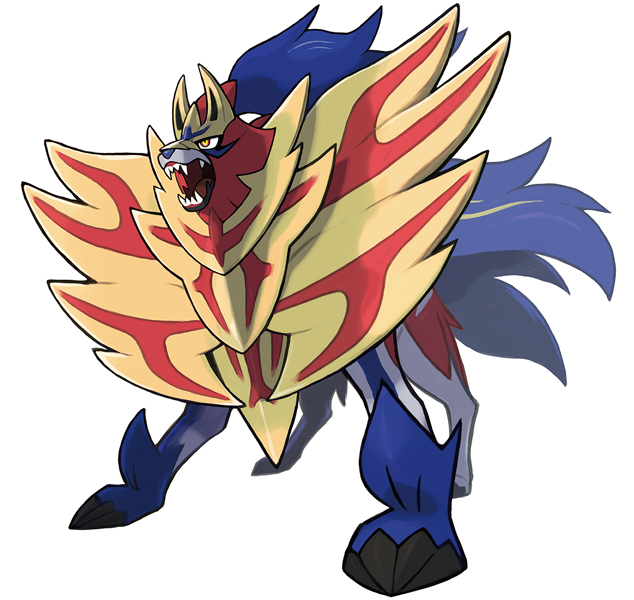
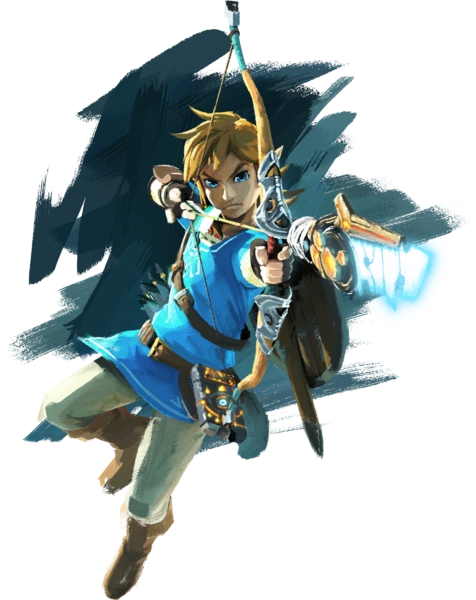
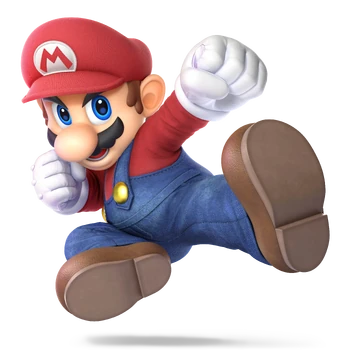
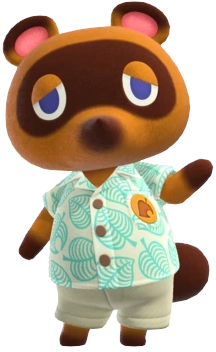
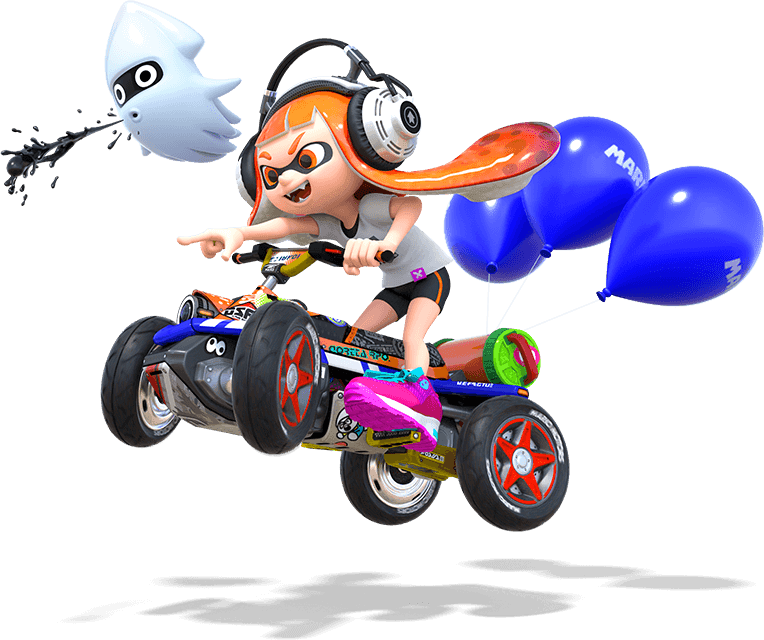

In [16]:
# Chargement des images
imgpokeshield = Image.open("imgpokeshield.png")
imgbotwlink = Image.open("imgbotwlink.png")
imgssbumario = Image.open("imgssbumario.png")
imgacnhnook = Image.open("imgacnhnook.png")
imgmkd8splt = Image.open("imgmkd8splt.png")


dfMax = df.groupby("Game").agg({"Sales":"max"}).reset_index().drop([5,6]).sort_values(by="Sales").replace({"POKE":"Pokémon Épée/Bouclier","ACNH":"Animal Crossing : New Horizons","SSBU":"Super Smash Bros. Ultimate","MKD8":"Mario Kart 8 Deluxe","BOTW":"The Legend of Zelda : Breath of the Wild"})

bestFive = go.Figure()

bestFive.add_trace(go.Bar(x = dfMax['Game'], 
                          y = dfMax['Sales'],
                          text = dfMax['Sales'],
                          marker_color = ["crimson","cornflowerblue","lightsteelblue","lightgreen","ivory"],
                          name = "TOP 5 Nintendo Switch",
                          hovertemplate = '%{x}'))

bestFive.update_traces(textfont_size=18,
                       textangle=0, 
                       textposition="outside", 
                       cliponaxis=False,
                       showlegend=False,
                       texttemplate = "%{text:.2s}M")

bestFive.add_layout_image(dict(source=imgpokeshield,
                               xref="x",
                               x=0,
                               y=0.02,))

bestFive.add_layout_image(dict(source=imgbotwlink,
                               xref="x",
                               x=1,
                               y=0.02,))

bestFive.add_layout_image(dict(source=imgssbumario,
                               xref="x",
                               x=2,
                               y=0.02,))

bestFive.add_layout_image(dict(source=imgacnhnook,
                               xref="x",
                               x=3,
                               y=0.02,))

bestFive.add_layout_image(dict(source=imgmkd8splt,
                               xref="x",
                               x=4,
                               y=0.02,))

bestFive.update_layout_images(dict(sizex=0.9,
                                   sizey=0.4,
                                   xanchor="center",
                                   yanchor="bottom"))


bestFive.update_yaxes(title="Unités vendues (en M)")
bestFive.update_xaxes(visible=False)

bestFive.update_layout(title="Meilleures ventes de la Nintendo Switch",
                       yaxis=dict(range=[0, 59]))

bestFive.show();


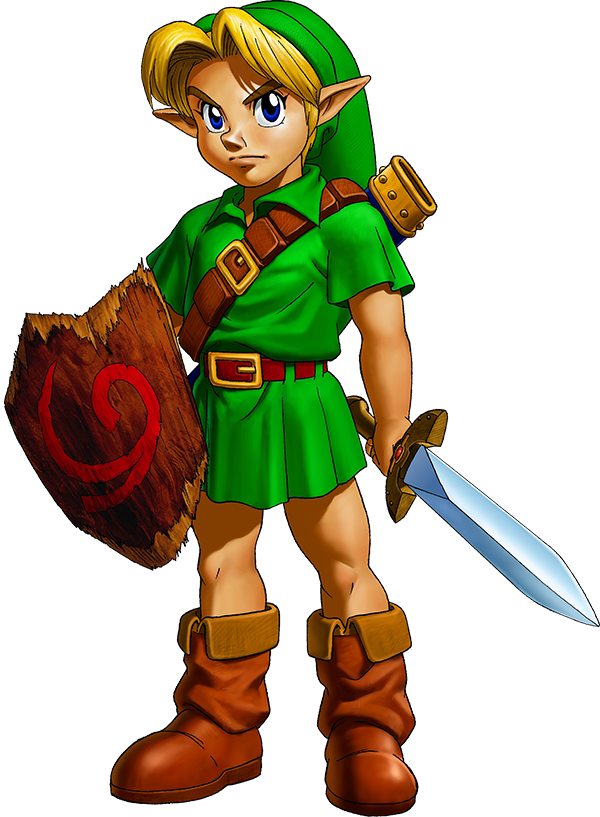
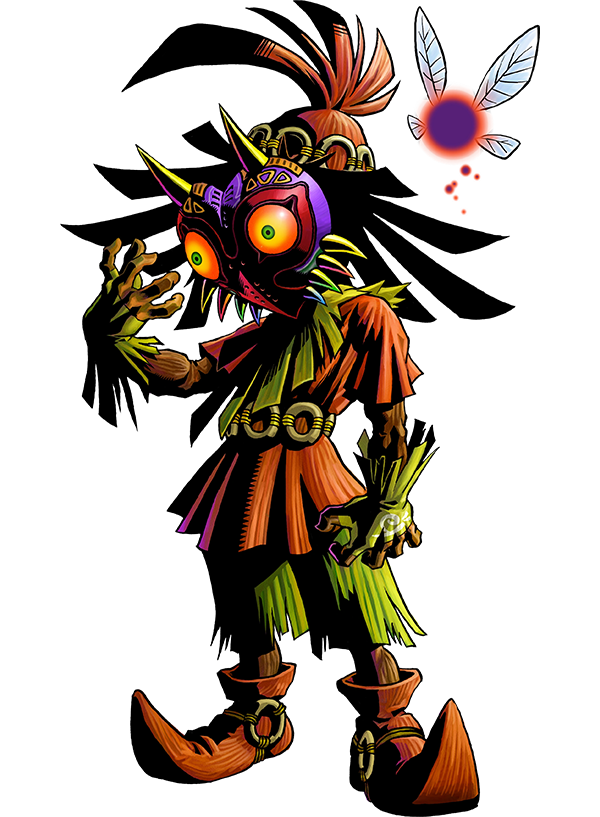
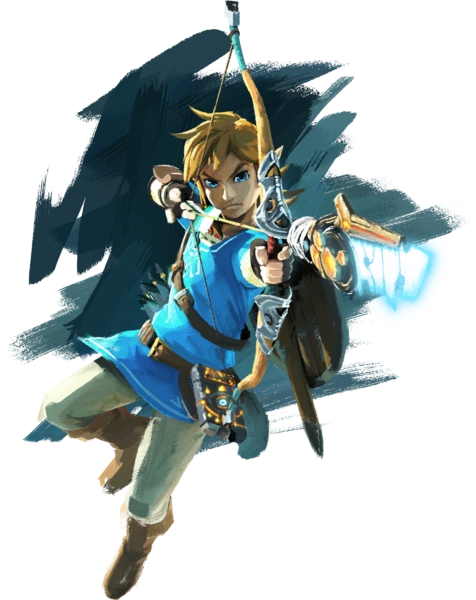
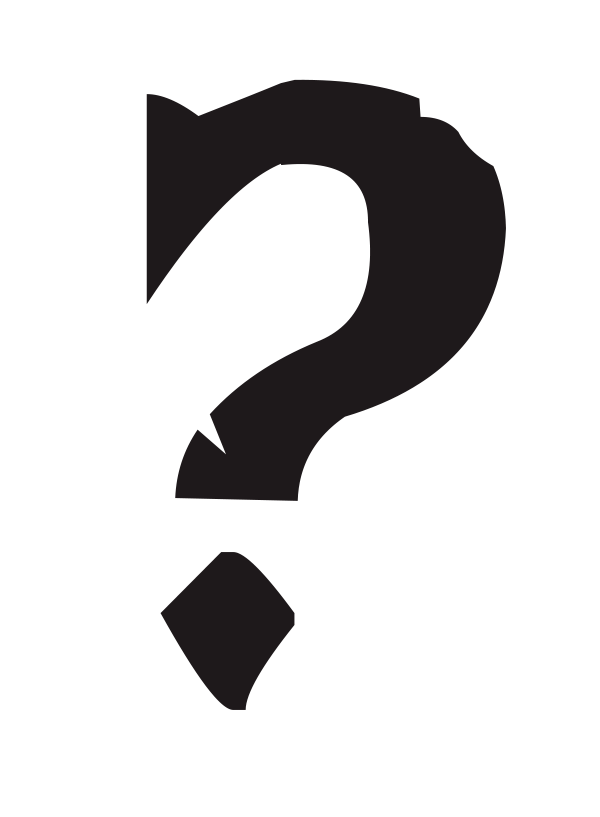

In [12]:
# Chargement des images
imgocarina = Image.open("imgocarina.png")
imgskullkid = Image.open("imgskullkid.png")
imgbotwlink = Image.open("imgbotwlink.png")
imgtotkmark = Image.open("imgtotkmark.png")

botw_z01 = ["Ocarina of Time","Majora's Mask"]
botw_z02 = ["Breath of the Wild","Tears of the Kingdom"]

botw_s01 = [7.6,3.36]
botw_s02 = [29,0]

botwprev = make_subplots(rows=1, cols=2)

botwprev.add_trace(go.Bar(x = botw_z01, 
                          y = botw_s01,
                          marker_color = ["#2ecc71","#af7ac5"]),
                          row=1, col=1)

botwprev.add_trace(go.Bar(x = botw_z02, 
                          y = botw_s02,
                          marker_color = ["cornflowerblue","grey"]),
                          row=1, col=2)

botwprev.update_traces(textfont_size=18,
                       textangle=0, 
                       textposition="inside", 
                       cliponaxis=False,
                       showlegend=False,
                       texttemplate = "            %{y:.2s}M")

botwprev.add_layout_image(dict(source=imgocarina,
                               xref="x",
                               x=-0.1,
                               y=0.02,))

botwprev.add_layout_image(dict(source=imgskullkid,
                               xref="x",
                               x=0.8,
                               y=0.02,))

botwprev.add_layout_image(dict(source=imgbotwlink,
                               xref="x2",
                               x=-0.1,
                               y=0.02,))

botwprev.add_layout_image(dict(source=imgtotkmark,
                               xref="x2",
                               x=1,
                               y=0.02,))

botwprev.update_layout_images(dict(sizex=0.9,
                                   sizey=0.5,
                                   xanchor="center",
                                   yanchor="bottom"))


botwprev.update_layout(title="The Legend of Zelda, seconds opus et prévisions",
                       yaxis=dict(range=[0, 9],
                                  title="Ventes en M$"),
                       yaxis2=dict(range=[0, 35],
                                   title="Ventes en M Units"))

botwprev.show();

In [13]:
acnhBad01Values = [103,72,52,51,48,41,39,38,31,30]
acnhBad01Labels = ["wait","boring","slow","disappointing","stupid","waiting","frustrating","unplayable","broken","quarantine"]

acnhBad01Values.reverse()
acnhBad01Labels.reverse()

acnhBad02Values = [119,90,36,35,35,33,24,21,21,19]
acnhBad02Labels = ["one island per console","one island per switch","One island per console","1 island per console","1 island per switch","one island per Switch","island per console one","console one island per","per console one island","One island per switch"]

acnhBad02Values.reverse()
acnhBad02Labels.reverse()


acnhText = make_subplots(rows=1, cols=2,
                         subplot_titles=("Mots seuls","Quadrigrammes"))

acnhText.add_trace(go.Bar(x=acnhBad01Values, 
                          y=acnhBad01Labels,
                          text=acnhBad01Labels,
                          orientation = "h",
                          name=""),
                  1, 1)

acnhText.add_trace(go.Bar(x=acnhBad02Values, 
                          y=acnhBad02Labels,
                          text=acnhBad02Labels,
                          orientation = "h",
                          name=""),
                  1, 2)

acnhText.update_layout(height=500, width=900, 
                       title_text="Mots les plus fréquents dans les commentaires négatifs",
                       coloraxis=dict(colorscale='Bluered_r'), showlegend=False)

acnhText.update_traces(hovertemplate="<b>%{x}</b><br>%{y}",
                      textposition = 'inside')

acnhText.update_yaxes(showticklabels=False)

acnhText.show()

In [14]:
pokeTextValues = [18,19,19,27,32,42,53,65,67,103]
pokeTextLabels = ["cheap","bland","rushed","awful","mediocre","disappointing","lazy","empty","repetitive","boring"]

pokeText = go.Figure()

pokeText.add_trace(go.Bar(x=pokeTextValues, 
                          y=pokeTextLabels,
                          text=pokeTextLabels,
                          orientation = "h",
                          marker_color = "red",
                          name=""))

pokeText.update_layout(title_text="Mots les plus fréquents dans les commentaires négatifs")

pokeText.update_traces(hovertemplate="<b>%{x}</b>")
pokeText.update_yaxes(showticklabels=False)

pokeText.show()